In [1]:
# data processing tools
import pandas as pd
import numpy as np
from numpy import mean
from numpy import std
from math import sqrt

# Visualization tools
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None

#Import model tools
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

In [62]:
data = pd.read_csv('/content/austinHousingData.csv')

In [9]:
data.head()
#data.describe()

,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage
0,111373431,pflugerville,14424 Lake Victor Dr,78660,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.430632,-97.663078,1.98,2,True,True,True,True,False,False,Single Family,2,2012,305000.0,5,2019-09-02,9,2019,"Coldwell Banker United, Realtors - South Austin",39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...
1,120900430,pflugerville,1104 Strickling Dr,78660,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.432673,-97.661697,1.98,2,True,True,True,True,False,False,Single Family,2,2013,295000.0,1,2020-10-13,10,2020,Agent Provided,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f...
2,2084491383,pflugerville,1408 Fort Dessau Rd,78660,Under construction - estimated completion in A...,30.409748,-97.639771,1.98,0,True,True,False,True,False,False,Single Family,0,2018,256125.0,1,2019-07-31,7,2019,Agent Provided,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_...
3,120901374,pflugerville,1025 Strickling Dr,78660,Absolutely darling one story home in charming ...,30.432112,-97.661659,1.98,2,True,True,True,True,False,False,Single Family,2,2013,240000.0,4,2018-08-08,8,2018,Agent Provided,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,120901374_b469367a619da85b1f5ceb69b675d88e-p_f...
4,60134862,pflugerville,15005 Donna Jane Loop,78660,Brimming with appeal & warm livability! Sleek ...,30.437368,-97.656860,1.98,0,True,True,False,True,False,False,Single Family,0,2002,239900.0,3,2018-10-31,10,2018,Agent Provided,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,60134862_b1a48a3df3f111e005bb913873e98ce2-p_f.jpg


# Data Exploration and Preparation

In [63]:
columns_drop = ['homeImage','streetAddress','description','latestPriceSource','propertyTaxRate','zpid']
data.drop(columns_drop, axis=1, inplace=True)
data.head()

,city,zipcode,latitude,longitude,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories
0,pflugerville,78660,30.430632,-97.663078,2,True,True,True,True,False,False,Single Family,2,2012,305000.0,5,2019-09-02,9,2019,39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2
1,pflugerville,78660,30.432673,-97.661697,2,True,True,True,True,False,False,Single Family,2,2013,295000.0,1,2020-10-13,10,2020,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1
2,pflugerville,78660,30.409748,-97.639771,0,True,True,False,True,False,False,Single Family,0,2018,256125.0,1,2019-07-31,7,2019,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1
3,pflugerville,78660,30.432112,-97.661659,2,True,True,True,True,False,False,Single Family,2,2013,240000.0,4,2018-08-08,8,2018,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1
4,pflugerville,78660,30.437368,-97.656860,0,True,True,False,True,False,False,Single Family,0,2002,239900.0,3,2018-10-31,10,2018,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2


In [11]:
data.describe()

,zipcode,latitude,longitude,garageSpaces,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories
count,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,1.517100e+04,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,1.517100e+04,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000,15171.000000
mean,78735.932964,30.291596,-97.778532,1.229187,1.224507,1988.554743,5.127677e+05,3.032892,6.733043,2019.078241,30.640432,0.012985,3.474722,1.710105,0.663371,0.466878,0.002768,0.208490,0.018852,1.190840e+05,2208.323314,0.940676,0.049173,1.035990,0.976798,1.838495,5.779912,1237.304660,14.857228,2.683010,3.440380,1.467273
std,18.893475,0.096973,0.084715,1.352117,1.352732,21.579458,4.531853e+05,2.487392,3.146760,0.813941,21.175174,0.179438,1.893351,0.788641,0.983779,0.824481,0.061771,0.488331,0.206775,1.225272e+07,1378.576119,0.236516,0.234937,0.263633,0.292043,1.068376,1.860276,326.513311,1.741857,1.054445,0.849942,0.523697
min,78617.000000,30.085030,-98.022057,0.000000,0.000000,1905.000000,5.500000e+03,1.000000,1.000000,2018.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+02,300.000000,0.000000,0.000000,0.000000,0.000000,0.200000,2.333333,396.000000,10.000000,0.000000,0.000000,1.000000
25%,78727.000000,30.203313,-97.838009,0.000000,0.000000,1974.000000,3.090000e+05,1.000000,4.000000,2018.000000,20.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.534000e+03,1483.000000,1.000000,0.000000,1.000000,1.000000,1.100000,4.000000,966.000000,14.000000,2.000000,3.000000,1.000000
50%,78739.000000,30.284416,-97.769539,1.000000,1.000000,1993.000000,4.050000e+05,2.000000,7.000000,2019.000000,29.000000,0.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.276000e+03,1975.000000,1.000000,0.000000,1.000000,1.000000,1.566667,5.778694,1287.000000,15.000000,3.000000,3.000000,1.000000
75%,78749.000000,30.366585,-97.717903,2.000000,2.000000,2006.000000,5.750000e+05,4.000000,9.000000,2020.000000,39.000000,0.000000,4.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.089000e+04,2687.000000,1.000000,0.000000,1.000000,1.000000,2.266667,7.000000,1496.000000,16.000000,3.000000,4.000000,2.000000
max,78759.000000,30.517323,-97.569504,22.000000,22.000000,2020.000000,1.350000e+07,23.000000,12.000000,2021.000000,179.000000,8.000000,12.000000,6.000000,8.000000,6.000000,2.000000,4.000000,8.000000,1.508483e+09,109292.000000,2.000000,2.000000,3.000000,2.000000,9.000000,9.500000,1913.000000,19.000000,27.000000,20.000000,4.000000


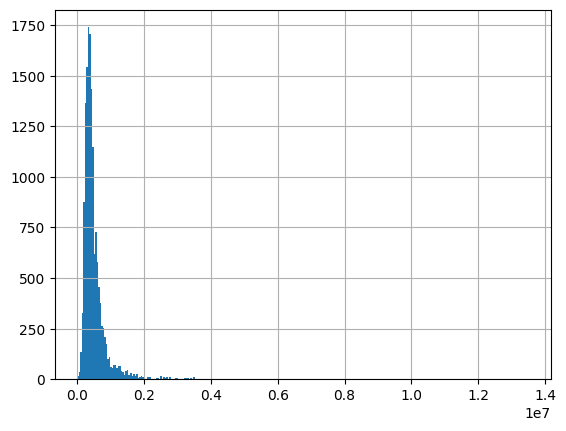

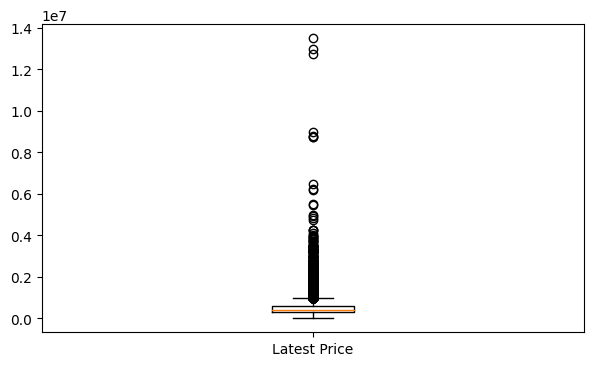

In [12]:
#Studying target variable
data['latestPrice'].hist(bins = 300)

fig = plt.figure(figsize=(7,4))
plt.boxplot(data['latestPrice'], labels= ['Latest Price'])
plt.show()

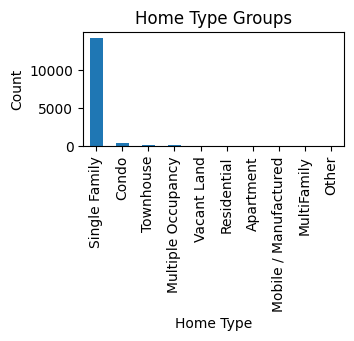

In [13]:
home_type_groups = data['homeType'].value_counts()

# Create the bar chart
plt.subplot(2, 2, 4)
home_type_groups.plot(kind='bar')
plt.title('Home Type Groups')
plt.xlabel('Home Type')
plt.ylabel('Count')

# Show the plot
plt.tight_layout()
plt.show()

In [14]:
#Analyze sale price on map using longitude and latitude
import folium
from branca.colormap import linear, LinearColormap

# Define a color scale based on the range of prices in the dataset
custom_colors = ['#2c7bb6', '#abd9e9', '#fdae61', '#d7191c']
colormap = LinearColormap(custom_colors, vmin=0, vmax=100).scale(data['latestPrice'].min(), data['latestPrice'].max())

# Create a map centered on Austin
austin_map = folium.Map(location=[30.2672, -97.7431], zoom_start=11, tiles='cartodbpositron')

# Add markers to the map for each house, with colors based on the price
for _, row in data.iterrows():
    folium.Circle(location=[row['latitude'], row['longitude']],
                  color=colormap(row['latestPrice']),
                  radius=row['latestPrice']/10000, # adjust the size of the circle as needed
                  fill=True,
                  fill_color=colormap(row['latestPrice'])).add_to(austin_map)

# Add the color scale legend to the map
colormap.caption = 'Sales Price (USD)'
colormap.add_to(austin_map)

# Display the map
austin_map

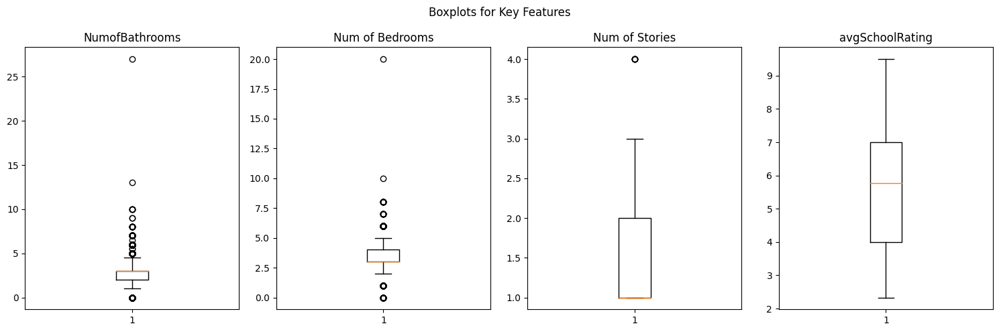

In [15]:
#Identify outliers by plotting boxplots
fig, axs = plt.subplots(1, 4, figsize=(15,5))

#Boxplots
axs[0].boxplot(data['numOfBathrooms'])
axs[0].set_title("NumofBathrooms")

axs[1].boxplot(data['numOfBedrooms'])
axs[1].set_title("Num of Bedrooms")

axs[2].boxplot(data['numOfStories'])
axs[2].set_title("Num of Stories")

axs[3].boxplot(data['avgSchoolRating'])
axs[3].set_title("avgSchoolRating")

# Customize the figure
fig.suptitle("Boxplots for Key Features")
plt.tight_layout()
plt.show()

# Data Cleaning

In [64]:
#Drop duplicates
data.drop_duplicates(inplace = True)

In [65]:
#Remove outliers
data = data[(data["numOfBedrooms"] >= 1) & (data["numOfBedrooms"] <= 8)]
data = data[(data["numOfBathrooms"] >= 1) & (data["numOfBathrooms"] <= 8)]
data = data[data["numOfStories"] <= 3]
data.head()

,city,zipcode,latitude,longitude,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories
0,pflugerville,78660,30.430632,-97.663078,2,True,True,True,True,False,False,Single Family,2,2012,305000.0,5,2019-09-02,9,2019,39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2
1,pflugerville,78660,30.432673,-97.661697,2,True,True,True,True,False,False,Single Family,2,2013,295000.0,1,2020-10-13,10,2020,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1
2,pflugerville,78660,30.409748,-97.639771,0,True,True,False,True,False,False,Single Family,0,2018,256125.0,1,2019-07-31,7,2019,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1
3,pflugerville,78660,30.432112,-97.661659,2,True,True,True,True,False,False,Single Family,2,2013,240000.0,4,2018-08-08,8,2018,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1
4,pflugerville,78660,30.437368,-97.656860,0,True,True,False,True,False,False,Single Family,0,2002,239900.0,3,2018-10-31,10,2018,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2


In [66]:
data.drop(columns = "hasAssociation", axis = 1, inplace = True)

In [19]:
data.describe()

,zipcode,latitude,longitude,garageSpaces,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories
count,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,1.501700e+04,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,1.501700e+04,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000,15017.000000
mean,78735.997802,30.291713,-97.778545,1.231937,1.227209,1988.645868,5.097472e+05,3.028035,6.730838,2019.077645,30.765599,0.012985,3.492975,1.712592,0.667643,0.470001,0.002664,0.209829,0.018912,1.199542e+05,2191.660918,0.941133,0.048612,1.034627,0.977625,1.837990,5.781517,1238.681161,14.861823,2.699471,3.448691,1.466538
std,18.874669,0.097232,0.084813,1.350654,1.351284,21.487282,4.250438e+05,2.479554,3.143967,0.813997,21.099075,0.179991,1.882566,0.784928,0.985720,0.826471,0.059909,0.489353,0.207515,1.231538e+07,999.426076,0.235665,0.234042,0.258576,0.291790,1.067050,1.860817,326.037315,1.740801,0.994556,0.810605,0.521094
min,78617.000000,30.085030,-98.022057,0.000000,0.000000,1905.000000,5.500000e+03,1.000000,1.000000,2018.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+02,300.000000,0.000000,0.000000,0.000000,0.000000,0.200000,2.333333,396.000000,10.000000,1.000000,1.000000,1.000000
25%,78727.000000,30.203014,-97.838043,0.000000,0.000000,1975.000000,3.090000e+05,1.000000,4.000000,2018.000000,20.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.534000e+03,1485.000000,1.000000,0.000000,1.000000,1.000000,1.100000,4.000000,966.000000,14.000000,2.000000,3.000000,1.000000
50%,78739.000000,30.284872,-97.769577,1.000000,1.000000,1993.000000,4.050000e+05,2.000000,7.000000,2019.000000,29.000000,0.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.276000e+03,1975.000000,1.000000,0.000000,1.000000,1.000000,1.566667,5.778694,1287.000000,15.000000,3.000000,3.000000,1.000000
75%,78749.000000,30.367125,-97.717995,2.000000,2.000000,2006.000000,5.749000e+05,4.000000,9.000000,2020.000000,39.000000,0.000000,4.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.089000e+04,2684.000000,1.000000,0.000000,1.000000,1.000000,2.266667,7.000000,1496.000000,16.000000,3.000000,4.000000,2.000000
max,78759.000000,30.517323,-97.569504,22.000000,22.000000,2020.000000,1.300000e+07,23.000000,12.000000,2021.000000,179.000000,8.000000,12.000000,6.000000,8.000000,6.000000,2.000000,4.000000,8.000000,1.508483e+09,11622.000000,2.000000,2.000000,3.000000,2.000000,9.000000,9.500000,1913.000000,19.000000,8.000000,8.000000,3.000000


# Feature encoding
Count encoding is useful when dealing with categorical features that have a high cardinality, that is large number of distinct categories. In such cases, one-hot encoding may not be practical as it could result in a large number of new features and a sparse feature matrix.

In [20]:
pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.6 MB/s eta 0:00:00


In [67]:
#Encode categorical variables such as hasView and hasSpa into binary values using labelencoder
import category_encoders as ce
count_encoder = ce.CountEncoder()

# Fit and transform the 'gender' column
data['homeType_count'] = count_encoder.fit_transform(data['homeType'])

# Convert date string to timestamp
data['latest_saledate'] = pd.to_datetime(data['latest_saledate'])
data['latest_saledate'] = data['latest_saledate'].apply(lambda x: int(x.timestamp()))

data.head()

,city,zipcode,latitude,longitude,garageSpaces,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeType_count
0,pflugerville,78660,30.430632,-97.663078,2,True,True,True,False,False,Single Family,2,2012,305000.0,5,1567382400,9,2019,39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,14202
1,pflugerville,78660,30.432673,-97.661697,2,True,True,True,False,False,Single Family,2,2013,295000.0,1,1602547200,10,2020,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,14202
2,pflugerville,78660,30.409748,-97.639771,0,True,False,True,False,False,Single Family,0,2018,256125.0,1,1564531200,7,2019,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,14202
3,pflugerville,78660,30.432112,-97.661659,2,True,True,True,False,False,Single Family,2,2013,240000.0,4,1533686400,8,2018,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,14202
4,pflugerville,78660,30.437368,-97.656860,0,True,False,True,False,False,Single Family,0,2002,239900.0,3,1540944000,10,2018,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,14202


In [68]:
#Split data into features (X) and target variable (y)
X = data.drop('latestPrice', axis=1)
y = data['latestPrice']

# Z-normalize X
X = (X - X.mean()) / X.std()

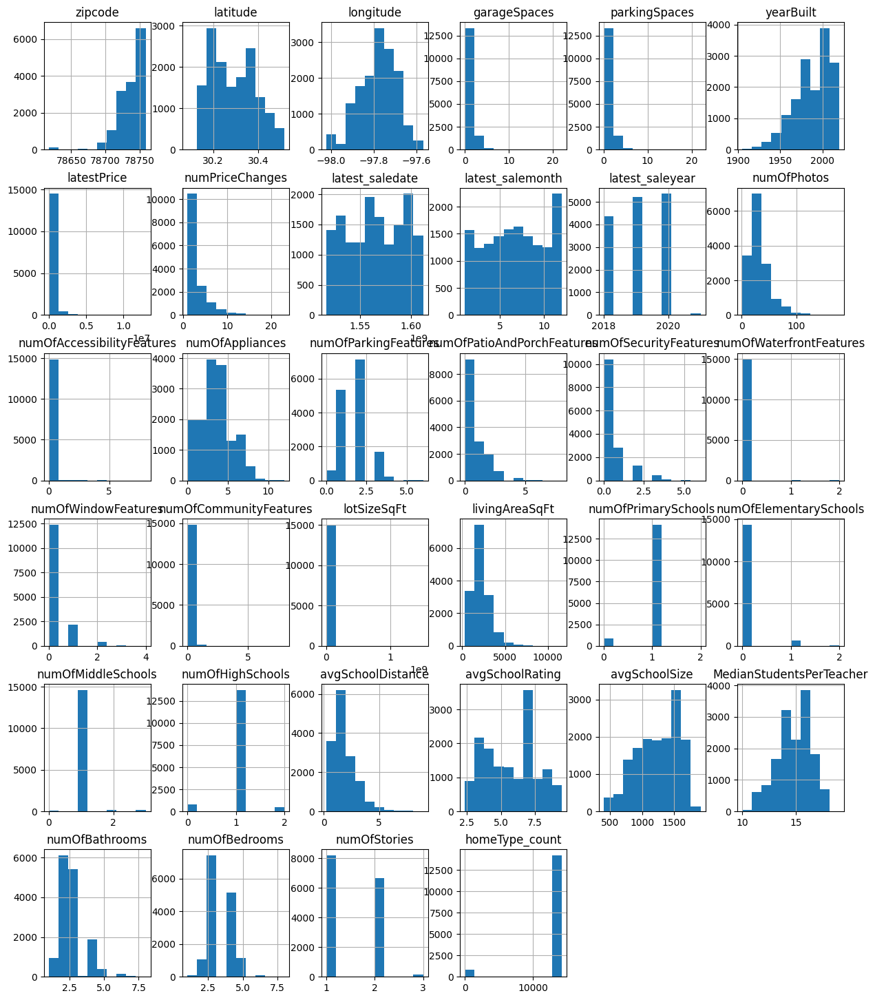

In [23]:
data.hist(figsize=(15, 18))
plt.show()

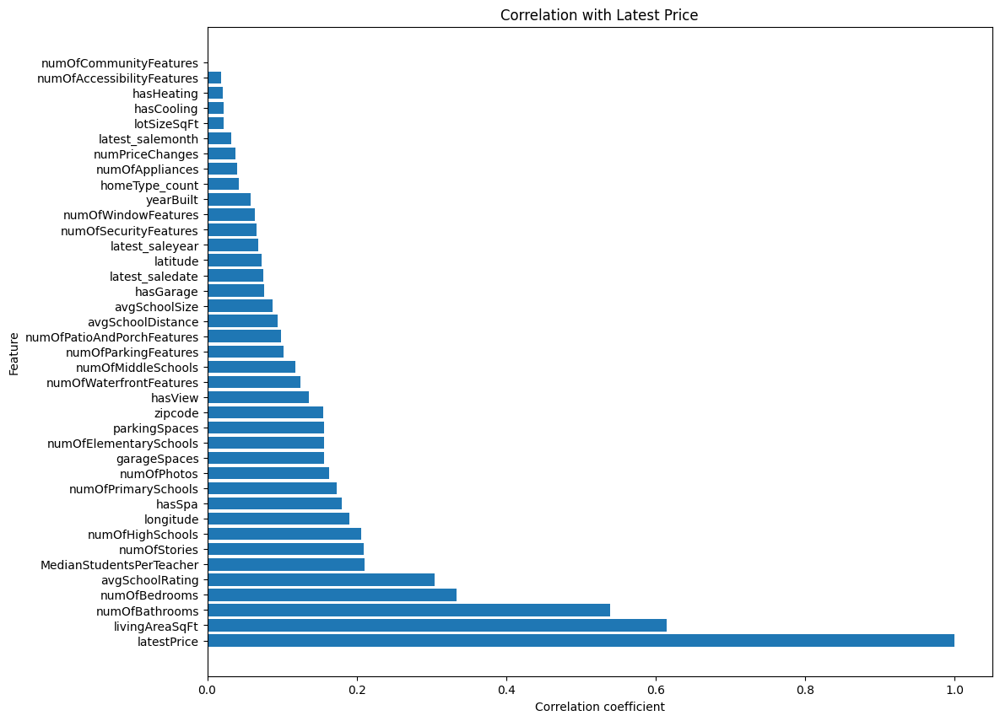

In [24]:
#Calulating correlation of features wrt target
corr_matrix = pd.concat([X, y], axis=1).corr().abs()

# Plot the bar chart on the second subplot
plt.figure(figsize=(12, 10))
corr_latestPrice = corr_matrix["latestPrice"].sort_values(ascending=False)
plt.barh(corr_latestPrice.index, corr_latestPrice)
plt.title("Correlation with Latest Price")
plt.xlabel("Correlation coefficient")
plt.ylabel("Feature")
plt.show()

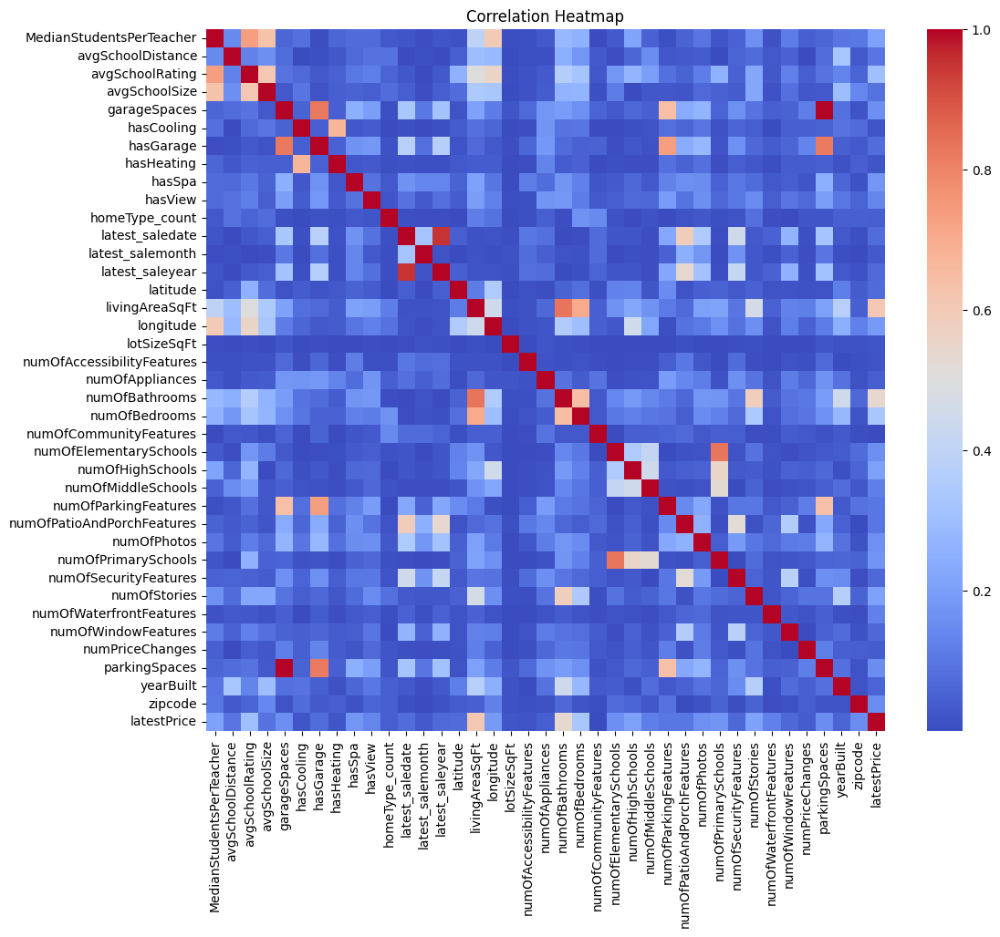

In [26]:
corr_matrix = pd.concat([X, y], axis=1).corr().abs()

# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

In [69]:
#For numeric features, selecting top 30 features and some features I think might be important.
features = set(corr_latestPrice[1:30].index)
features.add('lotSizeSqFt')
features

{'MedianStudentsPerTeacher',
 'avgSchoolDistance',
 'avgSchoolRating',
 'avgSchoolSize',
 'garageSpaces',
 'hasGarage',
 'hasSpa',
 'hasView',
 'latest_saledate',
 'latest_saleyear',
 'latitude',
 'livingAreaSqFt',
 'longitude',
 'lotSizeSqFt',
 'numOfBathrooms',
 'numOfBedrooms',
 'numOfElementarySchools',
 'numOfHighSchools',
 'numOfMiddleSchools',
 'numOfParkingFeatures',
 'numOfPatioAndPorchFeatures',
 'numOfPhotos',
 'numOfPrimarySchools',
 'numOfSecurityFeatures',
 'numOfStories',
 'numOfWaterfrontFeatures',
 'numOfWindowFeatures',
 'parkingSpaces',
 'yearBuilt',
 'zipcode'}

In [70]:
#Split data into training and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X[features], y, test_size=0.2, random_state=42)
print('X_train shape:', X_train.shape)
print('X_test shape:', X_test.shape)

X_train shape: (12013, 30)
X_test shape: (3004, 30)


Linear Regression

In [73]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error

# Create a Linear Regression model
lr = LinearRegression()

param_grid = {
    'fit_intercept': [True]
}

#Use GridSearchCV to search for the best parameters
grid_search = GridSearchCV(estimator=lr, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'fit_intercept': [True]},
             scoring='neg_mean_squared_error')

In [75]:
#Get the best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

#Evaluate the model with the best parameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error on Test Set:", rmse)

Best Parameters: {'fit_intercept': True}
Root Mean Squared Error on Test Set: 330853.9833340475


Random Forest

In [34]:
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold
from sklearn.ensemble import RandomForestClassifier as RFC
from sklearn.datasets import make_classification
from sklearn import metrics
from sklearn.metrics import accuracy_score

#Instantiate a random forest regressor object
rf = RandomForestRegressor(random_state=42)

#Define the parameter grid for the grid search
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10]
}

In [37]:
#Performing nested cross-validation with grid search
outer_cv = KFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = KFold(n_splits=5, shuffle=True, random_state=42)

grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=inner_cv,
    n_jobs=-1,
    verbose=1
)

In [38]:
#Fit the GridSearchCV object on training data
grid_search.fit(X=X_train, y=y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 15],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             verbose=1)

In [40]:
#Extracting the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters Random Forest:", best_params)

from sklearn.metrics import mean_squared_error
#Training the final random forest regressor using the best hyperparameters
rf_best = RandomForestRegressor(random_state=42, **best_params)
rf_best.fit(X=X_train, y=y_train)

# create a random forest regression model with 100 trees
rf = RandomForestRegressor(max_depth=15, n_estimators=300, random_state=42)

# train the model on the training data
rf.fit(X_train, y_train)

# make predictions on the test data
y_pred = rf.predict(X_test)

# evaluate the model performance using the mean squared error metric
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

Best Hyperparameters Random Forest: {'max_depth': 15, 'min_samples_split': 5, 'n_estimators': 100}
Root Mean Squared Error: 290847.36709508573


(0.0, 1500000.0)

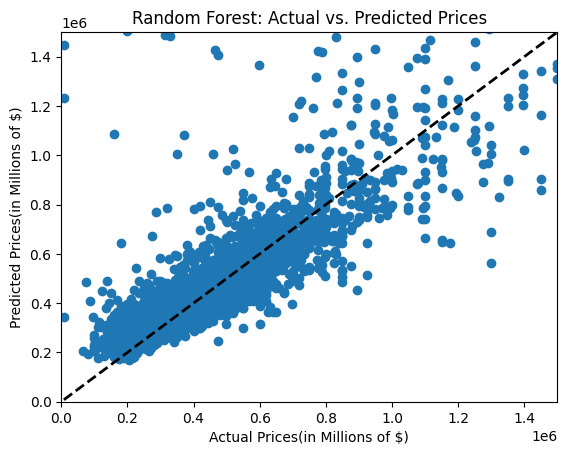

In [42]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Prices(in Millions of $)')
plt.ylabel('Predicted Prices(in Millions of $)')
plt.title('Random Forest: Actual vs. Predicted Prices')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlim(0, 1500000)
plt.ylim(0, 1500000)

LightGBM uses categorical features directly without one-hot encoding. It is expected that LightGBM trains faster

In [43]:
#import lightgbm package
import lightgbm as lgb

#Printing data types
print(data.dtypes)

city                           object
zipcode                         int64
latitude                      float64
longitude                     float64
garageSpaces                    int64
hasCooling                       bool
hasGarage                        bool
hasHeating                       bool
hasSpa                           bool
hasView                          bool
homeType                       object
parkingSpaces                   int64
yearBuilt                       int64
latestPrice                   float64
numPriceChanges                 int64
latest_saledate                 int64
latest_salemonth                int64
latest_saleyear                 int64
numOfPhotos                     int64
numOfAccessibilityFeatures      int64
numOfAppliances                 int64
numOfParkingFeatures            int64
numOfPatioAndPorchFeatures      int64
numOfSecurityFeatures           int64
numOfWaterfrontFeatures         int64
numOfWindowFeatures             int64
numOfCommuni

In [44]:
data

,city,zipcode,latitude,longitude,garageSpaces,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeType_count
0,pflugerville,78660,30.430632,-97.663078,2,True,True,True,False,False,Single Family,2,2012,305000.0,5,1567382400,9,2019,39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,14202
1,pflugerville,78660,30.432673,-97.661697,2,True,True,True,False,False,Single Family,2,2013,295000.0,1,1602547200,10,2020,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,14202
2,pflugerville,78660,30.409748,-97.639771,0,True,False,True,False,False,Single Family,0,2018,256125.0,1,1564531200,7,2019,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,14202
3,pflugerville,78660,30.432112,-97.661659,2,True,True,True,False,False,Single Family,2,2013,240000.0,4,1533686400,8,2018,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,14202
4,pflugerville,78660,30.437368,-97.656860,0,True,False,True,False,False,Single Family,0,2002,239900.0,3,1540944000,10,2018,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,14202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15166,austin,78748,30.161997,-97.816345,6,True,True,True,False,True,Single Family,6,1986,330000.0,1,1607558400,12,2020,49,0,3,2,4,0,0,0,0,6534.0,1234.0,1,0,1,1,0.900000,3.333333,1424,14,2.0,3,1,14202
15167,austin,78741,30.240223,-97.772835,2,True,True,True,True,True,Single Family,2,2016,550000.0,1,1608076800,12,2020,32,1,5,2,2,1,0,0,0,2439.0,1888.0,1,0,1,1,1.900000,6.666667,1226,16,4.0,3,3,14202
15168,austin,78704,30.244835,-97.761124,2,True,True,True,False,False,Single Family,2,1936,875000.0,7,1611705600,1,2021,20,0,3,3,0,0,0,0,0,9408.0,1524.0,1,0,1,1,0.800000,5.000000,889,13,3.0,3,2,14202
15169,austin,78722,30.281569,-97.717789,0,True,False,True,False,False,MultiFamily,0,1968,420000.0,5,1565136000,8,2019,15,0,3,1,0,0,0,0,0,6098.0,6068.0,1,0,1,1,1.300000,6.666667,1057,15,2.0,4,1,10


In [47]:
#hometype needs to stay and can be one-hot encoded
#lets see how many original values there are
values = data['homeType'].value_counts()
values = values[values >= 1].index.tolist()
print(values)

['Single Family', 'Condo', 'Townhouse', 'Multiple Occupancy', 'Residential', 'Apartment', 'Mobile / Manufactured', 'MultiFamily', 'Vacant Land', 'Other']


In [48]:
values = data['city'].value_counts()
values = values[values >= 1].index.tolist()
print(values)

['austin', 'del valle', 'pflugerville', 'driftwood', 'manor', 'dripping springs', 'manchaca', 'west lake hills', 'road']


In [49]:
#add categorical feature to the data
data['homeType'] = data['homeType'].astype('category').cat.codes
data['city'] = data['city'].astype('category').cat.codes

In [50]:
#Turn boolean columns into integers
for col in data.columns:
    if data[col].dtype == 'bool':
        data[col] = data[col].astype(int)

In [51]:
#Split data into features (X) and target variable (y)
X1 = data.drop('latestPrice', axis=1)
y1 = data['latestPrice']

In [52]:
print(X1.dtypes)

city                             int8
zipcode                         int64
latitude                      float64
longitude                     float64
garageSpaces                    int64
hasCooling                      int64
hasGarage                       int64
hasHeating                      int64
hasSpa                          int64
hasView                         int64
homeType                         int8
parkingSpaces                   int64
yearBuilt                       int64
numPriceChanges                 int64
latest_saledate                 int64
latest_salemonth                int64
latest_saleyear                 int64
numOfPhotos                     int64
numOfAccessibilityFeatures      int64
numOfAppliances                 int64
numOfParkingFeatures            int64
numOfPatioAndPorchFeatures      int64
numOfSecurityFeatures           int64
numOfWaterfrontFeatures         int64
numOfWindowFeatures             int64
numOfCommunityFeatures          int64
lotSizeSqFt 

In [53]:
#Split the data into training and validation sets
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(X1, y1, test_size=0.2, random_state=42)
print('X_train shape:', X_train.shape)
print('X_valid shape:', X_valid.shape)

X_train shape: (12013, 40)
X_valid shape: (3004, 40)


In [54]:
#Define the model parameters
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'learning_rate': 0.1,
    'num_leaves': 31,
    'verbose': -1,
}

In [58]:
#Train the model
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_valid, label=y_valid)

model = lgb.train(params, train_data, 1000, valid_sets=[train_data, valid_data])

In [59]:
#Evaluate the model
from sklearn.metrics import mean_squared_error
y_pred = model.predict(X_valid)
mse = mean_squared_error(y_valid, y_pred)
rmse = np.sqrt(mse)
print(f'RMSE: {rmse:.4f}')

RMSE: 281381.8991


In [60]:
#Initialize LGBMRegressor object
model = lgb.LGBMRegressor()

# fit the model
model.fit(X1, y1)

# get feature importance
feature_importance = model.feature_importances_
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

# Print top 20 most important features
print(importance_df.head(20))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2187
[LightGBM] [Info] Number of data points in the train set: 15017, number of used features: 40
[LightGBM] [Info] Start training from score 509747.218353
                       feature  importance
27              livingAreaSqFt         514
26                 lotSizeSqFt         287
3                    longitude         278
2                     latitude         272
12                   yearBuilt         193
1                      zipcode         160
17                 numOfPhotos         153
13             numPriceChanges         149
14             latest_saledate         145
32           avgSchoolDistance         140
36              numOfBathrooms         122
34               avgSchoolSize         121
33             avgSchoolRating

**Conclusion**
In this project, I created a model to predict the listing price of homes in Austin, TX using a dataset of recent house listings, including details like location, amenities, and prices. The data was preprocessed, handling missing values, converting boolean columns to integers, and encoding categorical features. Features like living area square footage, lot size, longitude, and latitude were identified as significant predictors through correlation matrix.
Model Building and Evaluation:
1. Linear Regression:
Best Parameters: The best linear regression model was found with the parameter fit_intercept set to True.
Performance: The Root Mean Squared Error (RMSE) on the test set was approximately 330,854.
2. Random Forest:
Best Parameters: The optimal random forest hyperparameters were found to be max_depth: 15, min_samples_split: 5, and n_estimators: 100.
Performance: The Random Forest model achieved an RMSE of approximately 290,847.
3. LightGBM:
Performance: The LightGBM model achieved an RMSE of around 281,381.
Feature Importance: The top features influencing the model included living area square footage, lot size, longitude, and latitude.


**Overall Evaluation:**
1. The LightGBM model outperformed the Random Forest and Linear Regression model, achieving a lower RMSE.
2. Living area square footage, lot size, and location (longitude, latitude) play a crucial role in predicting housing prices.
3. The Random Forest and LightGBM model, with carefully tuned hyperparameters, seems to be a suitable choice for predicting housing prices in the Austin area. LightGBM is beneficial if top features are mostly categorical.


**Future Steps:**
1. Further optimization of hyperparameters and feature engineering could potentially improve model performance.
2. If the model meets the desired performance, deploy it for real-time predictions and continuous monitoring.

This project provides insights into predicting housing prices in Austin, emphasizing the importance of location and specific property features.